In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/english-multispeaker-corpus-for-voice-cloning/README.txt
/kaggle/input/english-multispeaker-corpus-for-voice-cloning/license_text
/kaggle/input/english-multispeaker-corpus-for-voice-cloning/VCTK-Corpus/VCTK-Corpus/COPYING
/kaggle/input/english-multispeaker-corpus-for-voice-cloning/VCTK-Corpus/VCTK-Corpus/README
/kaggle/input/english-multispeaker-corpus-for-voice-cloning/VCTK-Corpus/VCTK-Corpus/speaker-info.txt
/kaggle/input/english-multispeaker-corpus-for-voice-cloning/VCTK-Corpus/VCTK-Corpus/NOTE
/kaggle/input/english-multispeaker-corpus-for-voice-cloning/VCTK-Corpus/VCTK-Corpus/wav48/p300/p300_169.wav
/kaggle/input/english-multispeaker-corpus-for-voice-cloning/VCTK-Corpus/VCTK-Corpus/wav48/p300/p300_117.wav
/kaggle/input/english-multispeaker-corpus-for-voice-cloning/VCTK-Corpus/VCTK-Corpus/wav48/p300/p300_331.wav
/kaggle/input/english-multispeaker-corpus-for-voice-cloning/VCTK-Corpus/VCTK-Corpus/wav48/p300/p300_358.wav
/kaggle/input/english-multispeaker-corpus-for-voice

In [2]:
!pip install tensorflow tensorflow-io matplotlib

In [2]:
import os
from matplotlib import pyplot as plt
import tensorflow as tf
import tensorflow_io as tfio
import numpy as np

In [4]:
import shutil
import fnmatch
import re

# Pre-calculate common_files
original_data_dir = '/kaggle/input/english-multispeaker-corpus-for-voice-cloning/VCTK-Corpus/VCTK-Corpus/wav48'
speaker_files = {} # dict use to store our speaker IDs to their respective wav files
for speaker_dir in sorted(os.listdir(original_data_dir)): # start from p225 and go up
    speaker_path = os.path.join(original_data_dir, speaker_dir)
    if os.path.isdir(speaker_path):
        speaker_id = speaker_dir[1:] if speaker_dir.startswith('p') else speaker_dir # basically just 225 instead of p225
        # Gives us our sorted list of wav files for specific speakers directory
        wav_files = sorted([f for f in os.listdir(speaker_path) if fnmatch.fnmatch(f, '*.wav')])
        speaker_files[speaker_id] = wav_files # store speakers wav files in dictionary

common_files = set()
# Iterate through each speaker's files
for speaker_id, files in speaker_files.items():
    for file_name in files:
        # extract the integer part of the file name using re
        match = re.search(r'_(\d+)\.wav$', file_name)
        if match:
            integer_part = match.group(1) # take out the integer part
            # check if the same file exists across all speakers!
            is_common = all(any(re.search(rf'_{integer_part}\.wav$', f) for f in speaker_files[other_speaker_id])
                           for other_speaker_id in speaker_files if other_speaker_id != speaker_id)
            if is_common: # if the file is common add it to the set!
                common_files.add(file_name)

print(sorted(common_files))

['p225_014.wav', 'p225_016.wav', 'p225_025.wav', 'p225_026.wav', 'p225_027.wav', 'p225_030.wav', 'p225_033.wav', 'p225_046.wav', 'p225_051.wav', 'p225_057.wav', 'p225_066.wav', 'p225_071.wav', 'p225_072.wav', 'p225_109.wav', 'p225_121.wav', 'p225_126.wav', 'p225_128.wav', 'p225_141.wav', 'p225_149.wav', 'p225_176.wav', 'p225_179.wav', 'p226_014.wav', 'p226_016.wav', 'p226_025.wav', 'p226_026.wav', 'p226_027.wav', 'p226_030.wav', 'p226_033.wav', 'p226_046.wav', 'p226_051.wav', 'p226_057.wav', 'p226_066.wav', 'p226_071.wav', 'p226_072.wav', 'p226_109.wav', 'p226_121.wav', 'p226_126.wav', 'p226_128.wav', 'p226_141.wav', 'p226_149.wav', 'p226_176.wav', 'p226_179.wav', 'p227_014.wav', 'p227_016.wav', 'p227_025.wav', 'p227_026.wav', 'p227_027.wav', 'p227_030.wav', 'p227_033.wav', 'p227_046.wav', 'p227_051.wav', 'p227_057.wav', 'p227_066.wav', 'p227_071.wav', 'p227_072.wav', 'p227_109.wav', 'p227_121.wav', 'p227_126.wav', 'p227_128.wav', 'p227_141.wav', 'p227_149.wav', 'p227_176.wav', 'p227_1

In [5]:
# Modified reorganize_data function
def reorganize_data(original_data_dir, new_data_dir, common_files, max_files_per_speaker=60):
    """
    Reorganize the data into speaker folders with a maximum file limit,
    using the pre-calculated common_files.

    :param original_data_dir: Path to the original data directory.
    :param new_data_dir: Path to the new data directory.
    :param common_files: Pre-calculated common files.
    :param max_files_per_speaker: Maximum number of files per speaker.

    :return: None
    """
    for speaker_dir in sorted(os.listdir(original_data_dir)):
        speaker_path = os.path.join(original_data_dir, speaker_dir)
        speaker_id = speaker_dir[1:] if speaker_dir.startswith('p') else speaker_dir # basically just 225 instead of p225

        if os.path.isdir(speaker_path):
            new_speaker_dir = os.path.join(new_data_dir, f'Speaker{speaker_id}')
            os.makedirs(new_speaker_dir, exist_ok=True)

            wav_files = sorted([f for f in os.listdir(speaker_path) if fnmatch.fnmatch(f, '*.wav')])
            file_count = 0
            for file_name in wav_files:
                if file_name in common_files and file_count < max_files_per_speaker:
                    original_file_path = os.path.join(speaker_path, file_name)
                    new_file_path = os.path.join(new_speaker_dir, file_name)
                    shutil.copy(original_file_path, new_file_path)
                    file_count += 1

# Example usage:
original_data_dir = '/kaggle/input/english-multispeaker-corpus-for-voice-cloning/VCTK-Corpus/VCTK-Corpus/wav48'
new_data_dir = '/data'
reorganize_data(original_data_dir, new_data_dir, common_files)

In [6]:
P225_WAV_FILE = os.path.join('/data', 'Speaker225','p225_014.wav')
P226_WAV_FILE = os.path.join('/data', 'Speaker226','p226_014.wav')

In [7]:
print(P225_WAV_FILE)
print(P226_WAV_FILE)

/data/Speaker225/p225_014.wav
/data/Speaker226/p226_014.wav


In [8]:
def load_wav_16k_mono(filename):
  # Load encoded wav file
  file_contents = tf.io.read_file(filename)

  # decode wave file. Instead of getting stereo we will get mono. (easier processing)
  wav, sample_rate = tf.audio.decode_wav(file_contents, desired_channels=1)

  # remove trailing axis
  wav = tf.squeeze(wav, axis=-1) # convert to 1D tensor
  sample_rate = tf.cast(sample_rate, dtype=tf.int64) # convert to int64 data type

  # ensure sample rate is 16000Hz - amp of audio signal
  wav = tfio.audio.resample(wav, rate_in=sample_rate, rate_out=16000)
  return wav

In [9]:
# USING SPEAKER p225

file_contents = tf.io.read_file(P225_WAV_FILE)
# print(f'file_contents: {file_contents}\n')
# Too long of a print statement but basically sound in string form

wav, sample_rate = tf.audio.decode_wav(file_contents, desired_channels=1)
print(f'wav: {wav}')
print(f'sample_rate: {sample_rate}\n')

wav = tf.squeeze(wav, axis=-1)
print(f'wav: {wav}')

sample_rate = tf.cast(sample_rate, dtype=tf.int64)
print(f'sample_rate: {sample_rate}\n')

wav = tfio.audio.resample(wav, rate_in=sample_rate, rate_out=16000)
print(f'wav: {wav}\n')

wav: [[0.00280762]
 [0.00454712]
 [0.00390625]
 ...
 [0.00204468]
 [0.00201416]
 [0.00244141]]
sample_rate: 48000

wav: [0.00280762 0.00454712 0.00390625 ... 0.00204468 0.00201416 0.00244141]
sample_rate: 48000

wav: [-2.1688676e-08  2.5889070e-08 -6.1285981e-09 ...  3.7008617e-03
  3.6878898e-03  3.6935278e-03]



In [10]:
p225_wave = load_wav_16k_mono(P225_WAV_FILE)
p226_wave = load_wav_16k_mono(P226_WAV_FILE)

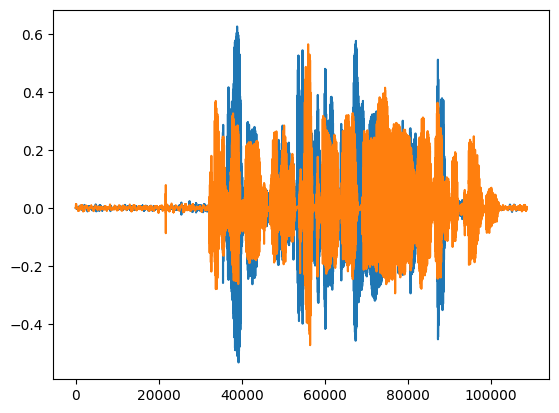

In [11]:
plt.plot(p225_wave)
plt.plot(p226_wave)
plt.show()

In [12]:
audio_files = []
speaker_labels = []

data_dir = '/data'  # Replace with the path to your reorganized data

for speaker_dir in sorted(os.listdir(data_dir)):
    speaker_path = os.path.join(data_dir, speaker_dir)
    if os.path.isdir(speaker_path):
        speaker_id = speaker_dir  # Use speaker directory name as label
        for file_name in sorted(os.listdir(speaker_path)):
            file_path = os.path.join(speaker_path, file_name)
            audio_files.append(file_path)
            speaker_labels.append(speaker_id)

print(f'audio_files: {audio_files}')
print(f'speaker_labels: {speaker_labels}')

audio_files: ['/data/Speaker225/p225_014.wav', '/data/Speaker225/p225_016.wav', '/data/Speaker225/p225_025.wav', '/data/Speaker225/p225_026.wav', '/data/Speaker225/p225_027.wav', '/data/Speaker225/p225_030.wav', '/data/Speaker225/p225_033.wav', '/data/Speaker225/p225_046.wav', '/data/Speaker225/p225_051.wav', '/data/Speaker225/p225_057.wav', '/data/Speaker225/p225_066.wav', '/data/Speaker225/p225_071.wav', '/data/Speaker225/p225_072.wav', '/data/Speaker225/p225_109.wav', '/data/Speaker225/p225_121.wav', '/data/Speaker225/p225_126.wav', '/data/Speaker225/p225_128.wav', '/data/Speaker225/p225_141.wav', '/data/Speaker225/p225_149.wav', '/data/Speaker225/p225_176.wav', '/data/Speaker225/p225_179.wav', '/data/Speaker226/p226_014.wav', '/data/Speaker226/p226_016.wav', '/data/Speaker226/p226_025.wav', '/data/Speaker226/p226_026.wav', '/data/Speaker226/p226_027.wav', '/data/Speaker226/p226_030.wav', '/data/Speaker226/p226_033.wav', '/data/Speaker226/p226_046.wav', '/data/Speaker226/p226_051.wa

In [13]:
filenames_ds = tf.data.Dataset.from_tensor_slices(audio_files)
labels_ds = tf.data.Dataset.from_tensor_slices(speaker_labels)

print(f'filenames_ds: {filenames_ds}')
print(f'labels_ds: {labels_ds}')

filenames_ds: <_TensorSliceDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>
labels_ds: <_TensorSliceDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>


In [14]:
def load_audio_label(file_path, label):
    audio = load_wav_16k_mono(file_path)  # Using your existing function
    return audio, label

# Create a zipped dataset of file paths and labels (file path, label)
zipped_ds = tf.data.Dataset.zip((filenames_ds, labels_ds))

# Map load_audio_label to the zipped dataset
audio_ds = zipped_ds.map(load_audio_label)  # Pass both file_path and label to load_audio_label

final_ds = audio_ds # audio_ds contains (audio, label) pairs

In [15]:
speaker_lengths = {}  # Initialize an empty dictionary

# Assuming you have audio_ds with (audio, label) pairs
for audio, label in audio_ds:
    length = len(audio)  # Get length of the audio tensor
    speaker_id = label.numpy().decode('utf-8') # Extract speaker ID

    # Store in the dictionary: {speaker_id: [lengths]}
    if speaker_id not in speaker_lengths:
        speaker_lengths[speaker_id] = []
    speaker_lengths[speaker_id].append(length)

print(speaker_lengths)

{'Speaker225': [106522, 125634, 56665, 41004, 49915, 72405, 106539, 60842, 41665, 103771, 54651, 37550, 55369, 40992, 37632, 26825, 45819, 46056, 79231, 70354, 49889], 'Speaker226': [108600, 137984, 60814, 43018, 90166, 62864, 83296, 98320, 67668, 43759, 38312, 104503, 107188, 59471, 70362, 81931, 90863, 57382, 75146, 75143, 75111], 'Speaker227': [99738, 128351, 58108, 45128, 48528, 56010, 44382, 40344, 56696, 38986, 66238, 55329, 69650, 54003, 73803, 92205, 106523, 45111, 65551, 48541, 72427], 'Speaker228': [93588, 131089, 36191, 80608, 34825, 41682, 63570, 26670, 58069, 62867, 83309, 36882, 30078, 99689, 60823, 56058, 58102, 54663, 89461, 62154, 75860], 'Speaker229': [77226, 96983, 25982, 54000, 28757, 54012, 30764, 40311, 43700, 30059, 30122, 33521, 48554, 44415, 56052, 39623, 57361, 38286, 68342, 32111, 73116], 'Speaker230': [94267, 144071, 37622, 52610, 64762, 78520, 74416, 47795, 49915, 65587, 66229, 30043, 44393, 59455, 64929, 64225, 36921, 32820, 77182, 79274, 53280], 'Speaker2

In [16]:
speaker_stats = {}  # Dictionary to store statistics

for speaker_id, lengths in speaker_lengths.items():
    # Convert lengths to a TensorFlow tensor
    lengths_tensor = tf.constant(lengths, dtype=tf.float32)

    # Calculate mean, min, and max
    mean = tf.reduce_mean(lengths_tensor).numpy()
    minimum = tf.reduce_min(lengths_tensor).numpy()
    maximum = tf.reduce_max(lengths_tensor).numpy()

    # Store in the speaker_stats dictionary
    speaker_stats[speaker_id] = {
        'mean': mean,
        'min': minimum,
        'max': maximum
    }

# Stats for Speaker225
print(speaker_stats['Speaker225'])

{'mean': 62349.047, 'min': 26825.0, 'max': 125634.0}


In [1]:
def preprocess(file_path, label):
  """
  Preprocess the file path and label into spectrogram

  :param file_path: Path to the audio file
  :param label: Label for the audio file

  :return: Spectrogram and label
  """
  wav = load_wav_16k_mono(file_path)
  wav = wav[:48000] # grab first 48000 steps from signals
  zero_padding = tf.zeros([48000] - tf.shape(wav), dtype=tf.float32)   # not all audio will meet 48000 so pad with zeros
  wav = tf.concat([zero_padding, wav],0) # append all the zeros in the start to give us our final file
  spectrogram = tf.signal.stft(wav, frame_length=320, frame_step=3) # short time fourier (creates spectogram)
  spectrogram = tf.abs(spectrogram) # gets rid of negatives
  spectrogram = tf.expand_dims(spectrogram, axis=2) # encaps spectogram in array to produce our deep learning model
    
  spectrogram = spectrogram[:8000, :, :] # new shape (8000, 257, 1) ......"for now"
  return spectrogram, label

In [19]:
wav = load_wav_16k_mono(P225_WAV_FILE)
wav = wav[:48000] # grab first 48000 steps from signals
zero_padding = tf.zeros([48000] - tf.shape(wav), dtype=tf.float32)   # not all audio will meet 48000 so pad with zeros
wav = tf.concat([zero_padding, wav],0) # append all the ze
wav

<tf.Tensor: shape=(48000,), dtype=float32, numpy=
array([-2.1688676e-08,  2.5889070e-08, -6.1285981e-09, ...,
       -1.1756761e-03, -3.4636777e-04, -2.3345968e-03], dtype=float32)>

In [20]:
spectrogram = tf.signal.stft(wav, frame_length=320, frame_step=3) 
spectrogram = tf.abs(spectrogram) # gets rid of negatives
spectrogram = tf.expand_dims(spectrogram, axis=2) # encaps spectogram giving it channel 1

In [21]:
spectrogram

<tf.Tensor: shape=(15894, 257, 1), dtype=float32, numpy=
array([[[4.35805619e-02],
        [1.90273881e-01],
        [2.23430082e-01],
        ...,
        [1.46844502e-06],
        [4.51052500e-07],
        [3.03611159e-07]],

       [[2.94098258e-02],
        [1.88448697e-01],
        [2.23165751e-01],
        ...,
        [1.41186047e-06],
        [4.46351351e-07],
        [2.57045031e-07]],

       [[1.51718175e-02],
        [1.87074795e-01],
        [2.22858265e-01],
        ...,
        [1.38165592e-06],
        [4.48584359e-07],
        [1.81607902e-07]],

       ...,

       [[2.30326772e-01],
        [2.13185385e-01],
        [1.58970818e-01],
        ...,
        [1.54119880e-05],
        [1.07036321e-05],
        [7.00354576e-06]],

       [[2.33871430e-01],
        [2.14585140e-01],
        [1.57492682e-01],
        ...,
        [1.39144695e-05],
        [1.15678822e-05],
        [7.30156898e-06]],

       [[2.37040207e-01],
        [2.15724140e-01],
        [1.55882716e-01

In [22]:
filepath, label = audio_files[0], speaker_labels[0]
spectrogram, label = preprocess(filepath, label)
spectrogram

<tf.Tensor: shape=(15894, 257, 1), dtype=float32, numpy=
array([[[4.35805619e-02],
        [1.90273881e-01],
        [2.23430082e-01],
        ...,
        [1.46844502e-06],
        [4.51052500e-07],
        [3.03611159e-07]],

       [[2.94098258e-02],
        [1.88448697e-01],
        [2.23165751e-01],
        ...,
        [1.41186047e-06],
        [4.46351351e-07],
        [2.57045031e-07]],

       [[1.51718175e-02],
        [1.87074795e-01],
        [2.22858265e-01],
        ...,
        [1.38165592e-06],
        [4.48584359e-07],
        [1.81607902e-07]],

       ...,

       [[2.30326772e-01],
        [2.13185385e-01],
        [1.58970818e-01],
        ...,
        [1.54119880e-05],
        [1.07036321e-05],
        [7.00354576e-06]],

       [[2.33871430e-01],
        [2.14585140e-01],
        [1.57492682e-01],
        ...,
        [1.39144695e-05],
        [1.15678822e-05],
        [7.30156898e-06]],

       [[2.37040207e-01],
        [2.15724140e-01],
        [1.55882716e-01

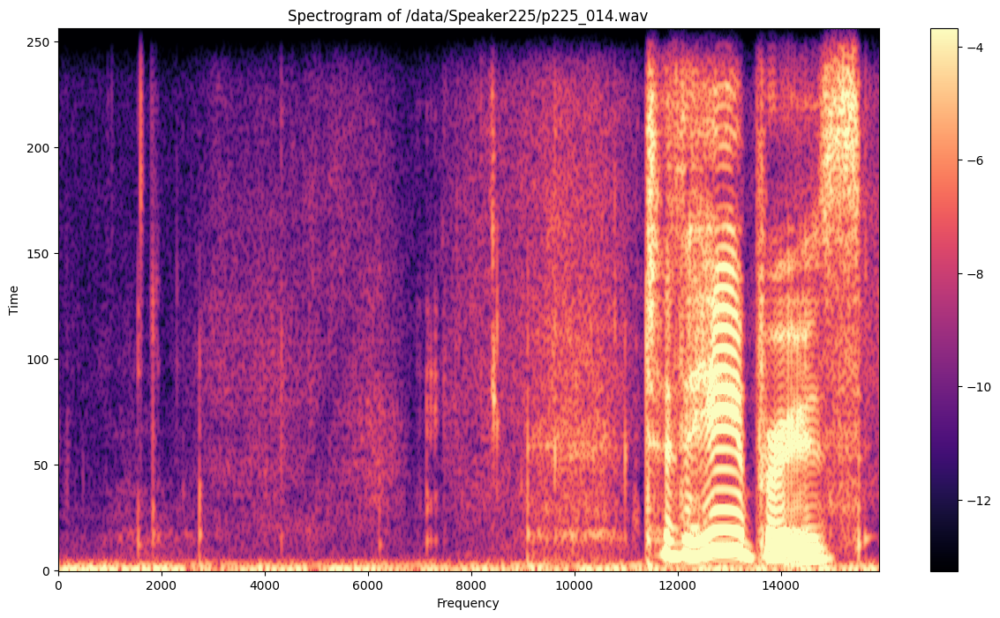

In [23]:
# Visualize the spectrogram
plt.figure(figsize=(15, 8))
spectrogram_data = tf.transpose(spectrogram).numpy().squeeze()

# Normalize the data to 0-1 range
normalized_spectrogram = (spectrogram_data - np.min(spectrogram_data)) / (np.max(spectrogram_data) - np.min(spectrogram_data))

# Apply log transformation
log_spectrogram = np.log(normalized_spectrogram + 1e-6)

# Calculate percentile-based color limits
vmin = np.percentile(log_spectrogram, 2)  # 2nd percentile
vmax = np.percentile(log_spectrogram, 98)  # 98th percentile

# Display the spectrogram
plt.imshow(log_spectrogram, origin='lower', aspect='auto', cmap='magma', vmin=vmin, vmax=vmax)  # Changed colormap and color limits
plt.title(f"Spectrogram of {audio_files[0]}")
plt.xlabel("Frequency")
plt.ylabel("Time")
plt.colorbar()
plt.show()

In [23]:
print(labels_ds)

<_TensorSliceDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>


In [30]:
spectrogram_ds = tf.data.Dataset.zip((filenames_ds, labels_ds))
spectrogram_ds.as_numpy_iterator().next() # holds (filepath, label)

(b'/data/Speaker225/p225_014.wav', b'Speaker225')

In [31]:
spectrogram_ds = spectrogram_ds.map(preprocess) # return (spectogram, label) into spect_ds
spectrogram_ds = spectrogram_ds.cache() # Caches the elements in the dataset.
spectrogram_ds = spectrogram_ds.shuffle(buffer_size=1000) # mix up all our training samples
spectrogram_ds = spectrogram_ds.batch(8) # group our samples into batches of 16
spectrogram_ds = spectrogram_ds.prefetch(8) # helps prevent bottlenecks

In [33]:
print(len(spectrogram_ds))

train = spectrogram_ds.take(70) # take first 101
test = spectrogram_ds.skip(70).take(30) # take last 43

287


In [34]:
samples, labels = train.as_numpy_iterator().next()

In [35]:
print(labels)

[b'Speaker271' b'Speaker231' b'Speaker234' b'Speaker266' b'Speaker274'
 b'Speaker240' b'Speaker246' b'Speaker256']


In [36]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten

In [ ]:
model = Sequential() # define model
# add convolutional layers
model.add(Conv2D(16, (3,3), activation='relu', input_shape=(8000, 257, 1)))
model.add(Conv2D(16, (3,3), activation='relu'))
# # flattening convolutional outputs into a 1-demensional output
model.add(Flatten())
# model.add(Dense(128, activation='relu'))
# model.add(Dense(109, activation='softmax'))

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
